<a href="https://colab.research.google.com/drive/1JVJ-vRgqDG5LUoYS7PgpiziSTgcb9jKA?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Loading Dataset And Labelling

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
fname = "kay_labels.npy"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/r638s/download
fname = "kay_images.npz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/ymnjv/download
with np.load(fname) as dobj:
    dat = dict(**dobj)
labels = np.load('kay_labels.npy')

In [ ]:
print(labels[0,:].shape)

(1750,)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
feat = np.load('/content/drive/My Drive/Team KayGallant/Data/vgg16_train_convfeatures.npy',allow_pickle=True)

In [ ]:
l=2
layer = feat.item().get('layer{}'.format(l))
print(layer.shape)
data = np.reshape(layer,(layer.shape[0],layer.shape[1]*layer.shape[2]*layer.shape[3]))
print(data.shape)

(1750, 64, 19, 19)
(1750, 23104)


##Assigning Number to Labels

In [ ]:
label_index_l = []
for i in range(4):
  label_index = {}
  check = labels[i,:]
  uniques = np.unique(check)
  uniques = list(uniques)
  j = 0
  for labl in uniques:
    label_index[labl] = j
    j+=1
  label_index_l.append(label_index)

In [ ]:
responses= dat['responses']

In [ ]:
print(data.shape)
print(responses.shape)

(1750, 23104)
(1750, 8428)


##Choose Label

In [ ]:
index = 0    #Change the index to one you want to use. Like if you want to use 1st labels,index =0 ... 
num_labels = np.array([label_index_l[index][i] for i in list(labels[index,:])])
print(len(np.unique(num_labels)))

8


# Dimensionality Reduction Tool

##PCA

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 2)

##TSNE

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components = 2)

##LDA (LinearDiscriminantAnalysis)

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA_
lda_ = LDA_(n_components =2)

##LDA (LatentDirichletAllocation)

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation as LDA
lda = LDA(n_components = 2)

# Use Dimensional Reductionality Tool.

##On Features

Layer: 1
(1750, 64, 19, 19)
(1750, 23104)


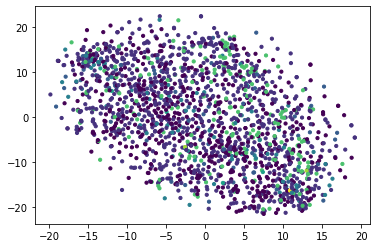

Layer: 2
(1750, 64, 19, 19)
(1750, 23104)


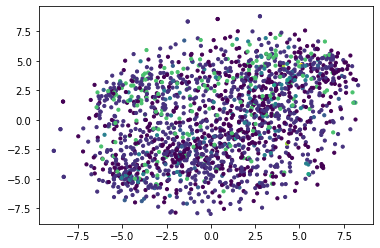

Layer: 3
(1750, 128, 14, 14)
(1750, 25088)


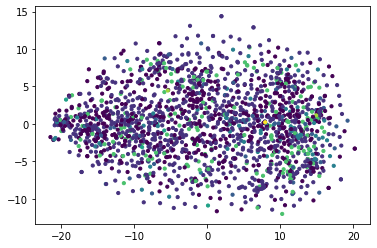

Layer: 4
(1750, 128, 14, 14)
(1750, 25088)


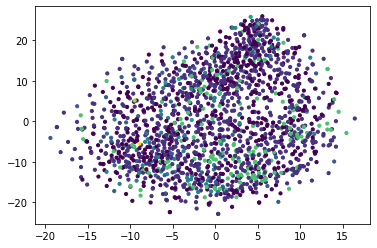

Layer: 5
(1750, 256, 10, 10)
(1750, 25600)


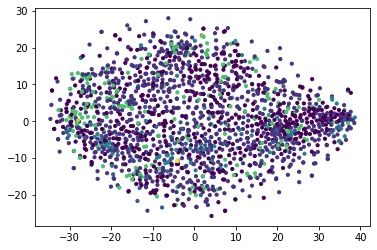

Layer: 6
(1750, 256, 10, 10)
(1750, 25600)


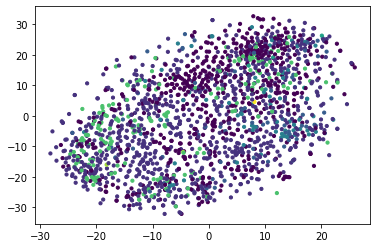

Layer: 7
(1750, 256, 10, 10)
(1750, 25600)


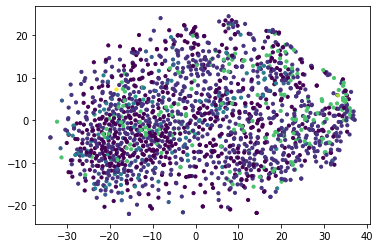

Layer: 8
(1750, 512, 7, 7)
(1750, 25088)


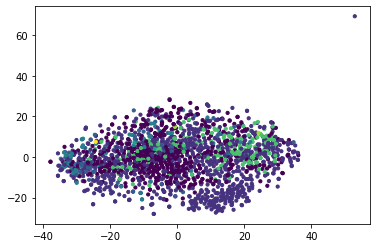

Layer: 9
(1750, 512, 7, 7)
(1750, 25088)


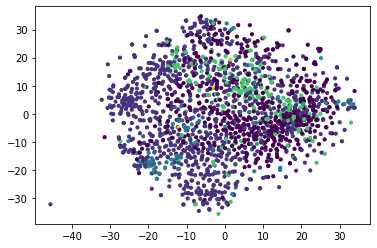

Layer: 10
(1750, 512, 7, 7)
(1750, 25088)


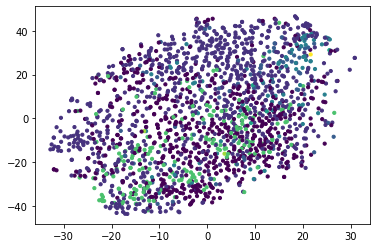

Layer: 11
(1750, 512, 7, 7)
(1750, 25088)


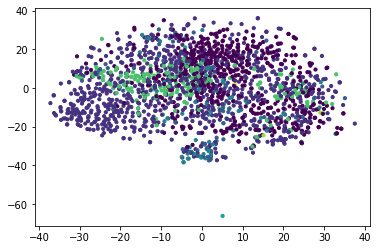

Layer: 12
(1750, 512, 7, 7)
(1750, 25088)


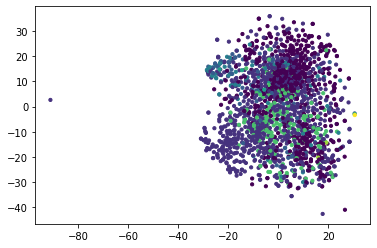

In [ ]:
for l in range(1,13):
  layer = feat.item().get('layer{}'.format(l))
  print("Layer: {}".format(l))
  print(layer.shape)
  data = np.reshape(layer,(layer.shape[0],-1))
  print(data.shape)
  X_reduced = tsne.fit_transform(data)  
  plt.scatter(X_reduced[:,0], X_reduced[:,1], c = num_labels,s = 10) 
  plt.show()

Layer: 13
(1750, 512, 7, 7)
(1750, 25088)


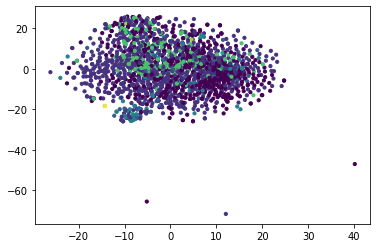

In [ ]:
layer = feat.item().get('layer{}'.format(13))
print("Layer: {}".format(13))
print(layer.shape)
data = np.reshape(layer,(layer.shape[0],-1))
print(data.shape)
X_reduced = tsne.fit_transform(data)  
plt.scatter(X_reduced[:,0], X_reduced[:,1], c = num_labels,s = 10) 
plt.show()

#Clustering Different Layers

##Cosine Similarity

Layer: 1
(1750, 64, 19, 19)
(1750, 23104)
Features plotted:


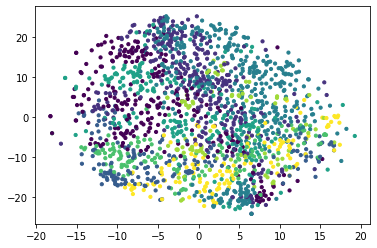

Voxel Activity Plotted:


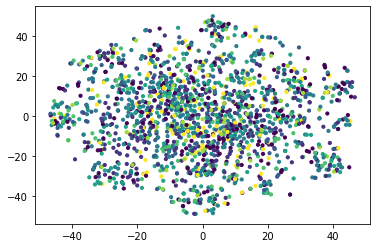

Layer: 2
(1750, 64, 19, 19)
(1750, 23104)
Features plotted:


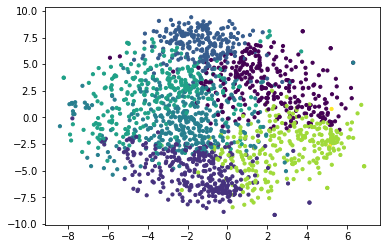

Voxel Activity Plotted:


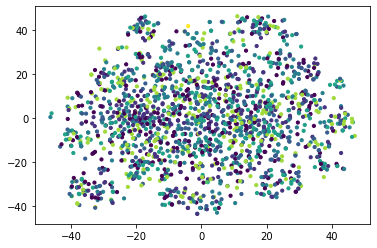

Layer: 3
(1750, 128, 14, 14)
(1750, 25088)
Features plotted:


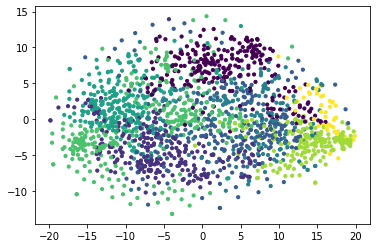

Voxel Activity Plotted:


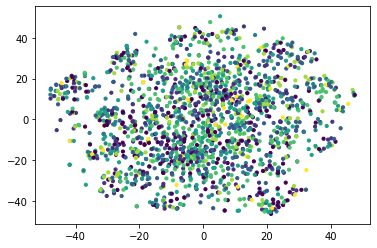

Layer: 4
(1750, 128, 14, 14)
(1750, 25088)
Features plotted:


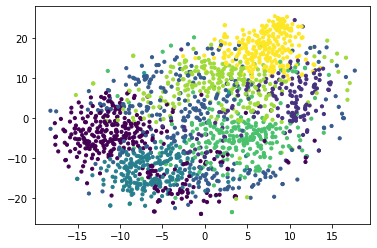

Voxel Activity Plotted:


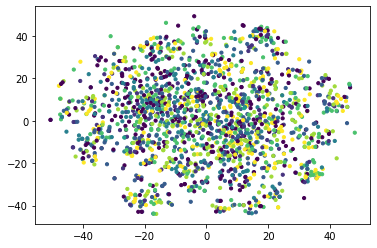

Layer: 5
(1750, 256, 10, 10)
(1750, 25600)
Features plotted:


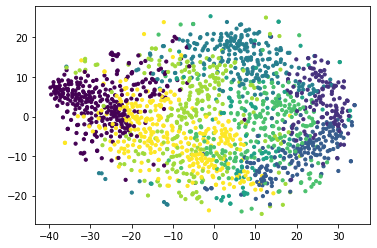

Voxel Activity Plotted:


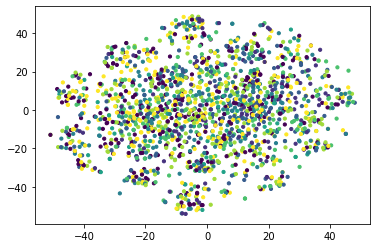

Layer: 6
(1750, 256, 10, 10)
(1750, 25600)
Features plotted:


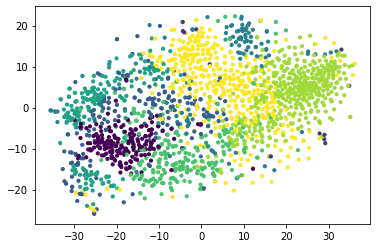

Voxel Activity Plotted:


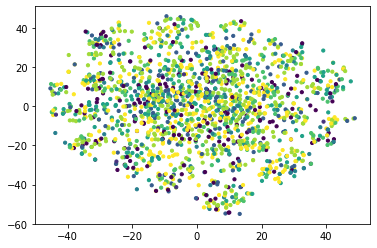

Layer: 7
(1750, 256, 10, 10)
(1750, 25600)
Features plotted:


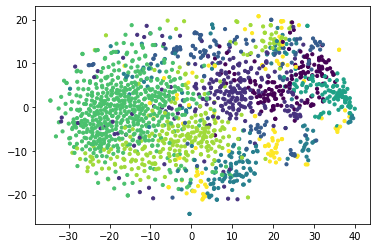

Voxel Activity Plotted:


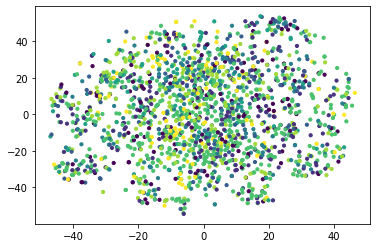

Layer: 8
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


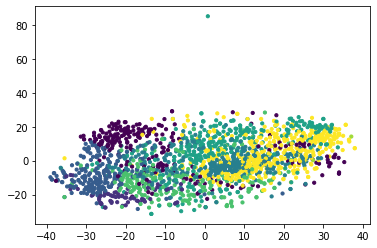

Voxel Activity Plotted:


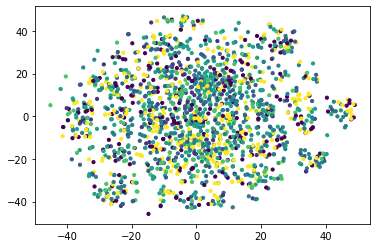

Layer: 9
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


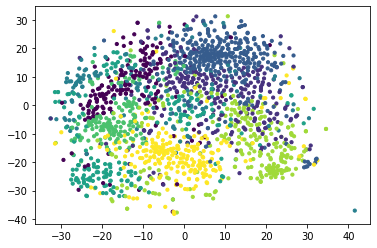

Voxel Activity Plotted:


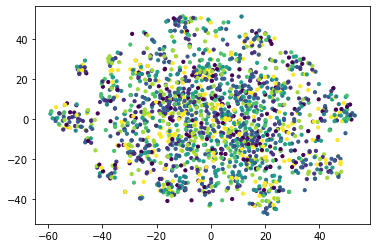

Layer: 10
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


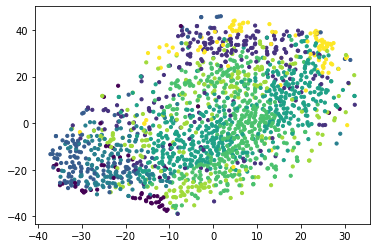

Voxel Activity Plotted:


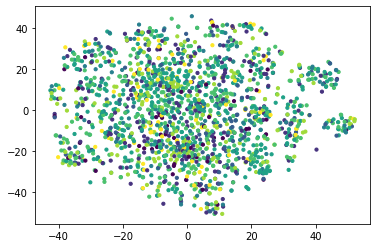

Layer: 11
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


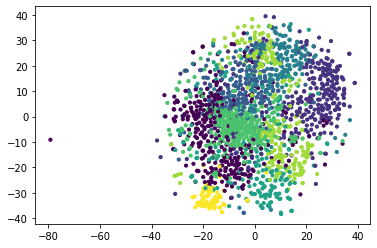

Voxel Activity Plotted:


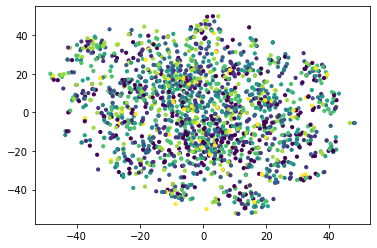

Layer: 12
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


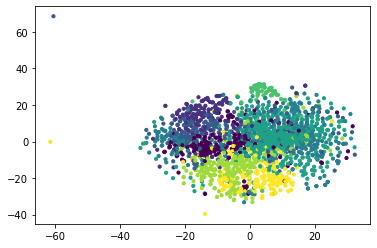

Voxel Activity Plotted:


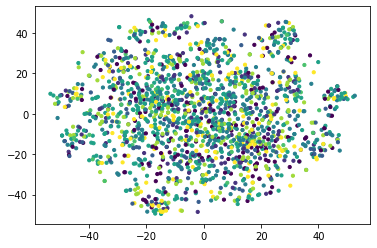

Layer: 13
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


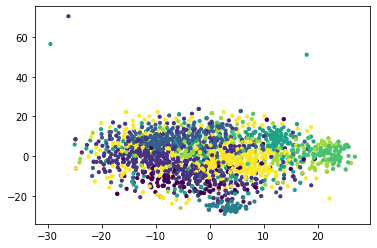

Voxel Activity Plotted:


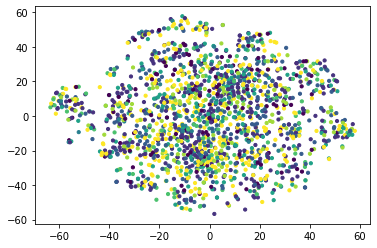

In [ ]:
for l in range(1,14):
  layer = feat.item().get('layer{}'.format(l))
  print("Layer: {}".format(l))
  print(layer.shape)
  data = np.reshape(layer,(layer.shape[0],-1))
  print(data.shape)
  X_reduced = tsne.fit_transform(data)  
  clusteres = k_cosine(data,n_components = 8,max_itr = 10)
  Y_reduced = tsne.fit_transform(responses)   
  print("Features plotted:")
  plt.scatter(X_reduced[:,0], X_reduced[:,1], c = clusteres,s = 10)
  plt.show()
  print("Voxel Activity Plotted:")
  plt.scatter(Y_reduced[:,0],Y_reduced[:,1],c=clusteres,s=10) 
  plt.show()

##K-means

Layer: 1
(1750, 64, 19, 19)
(1750, 23104)
Features plotted:


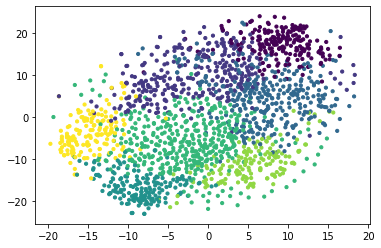

Voxel Activity Plotted:


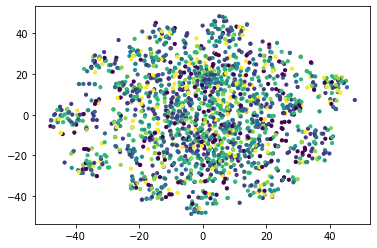

Layer: 2
(1750, 64, 19, 19)
(1750, 23104)
Features plotted:


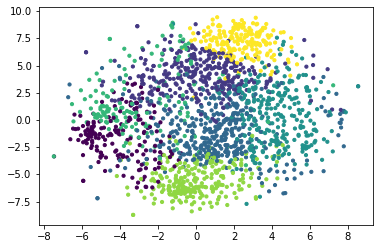

Voxel Activity Plotted:


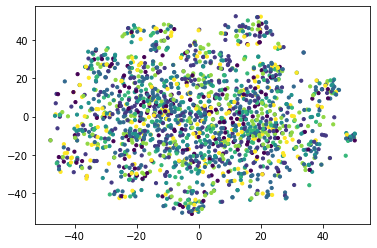

Layer: 3
(1750, 128, 14, 14)
(1750, 25088)
Features plotted:


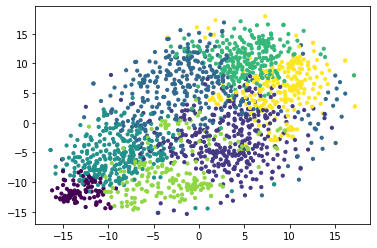

Voxel Activity Plotted:


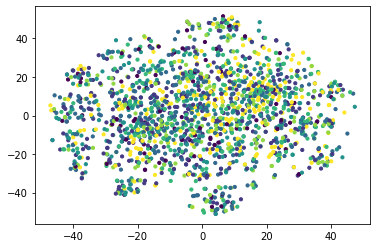

Layer: 4
(1750, 128, 14, 14)
(1750, 25088)
Features plotted:


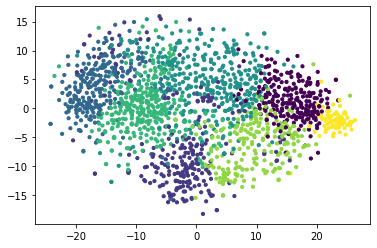

Voxel Activity Plotted:


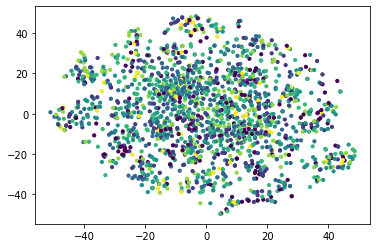

Layer: 5
(1750, 256, 10, 10)
(1750, 25600)
Features plotted:


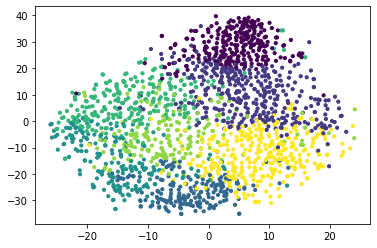

Voxel Activity Plotted:


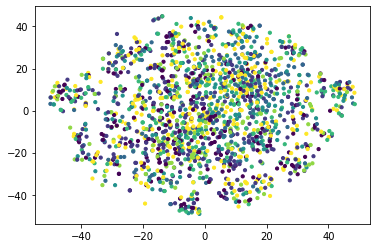

Layer: 6
(1750, 256, 10, 10)
(1750, 25600)
Features plotted:


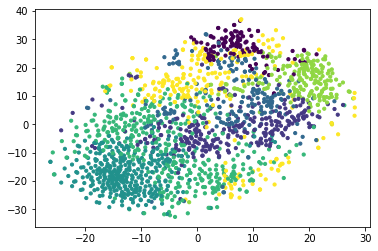

Voxel Activity Plotted:


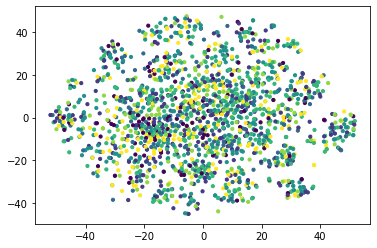

Layer: 7
(1750, 256, 10, 10)
(1750, 25600)
Features plotted:


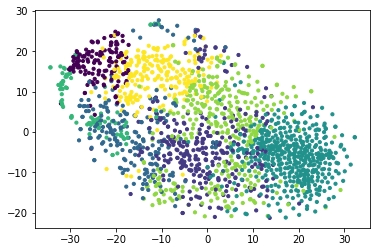

Voxel Activity Plotted:


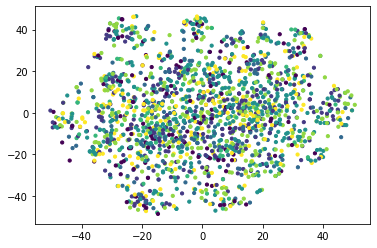

Layer: 8
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


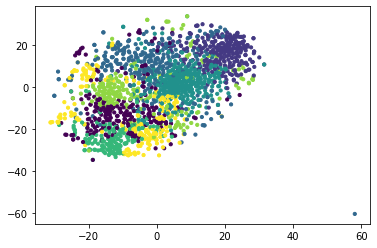

Voxel Activity Plotted:


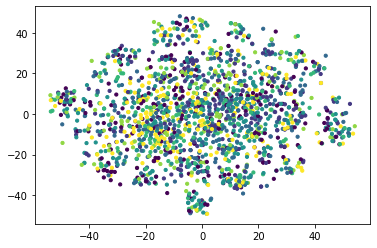

Layer: 9
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


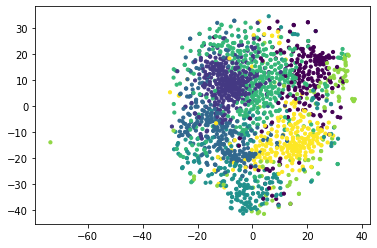

Voxel Activity Plotted:


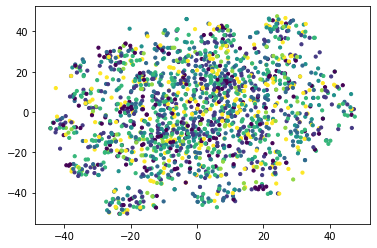

Layer: 10
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


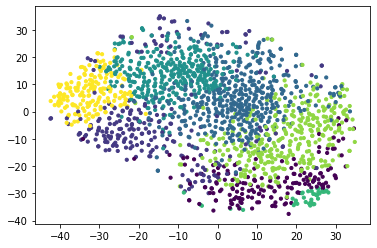

Voxel Activity Plotted:


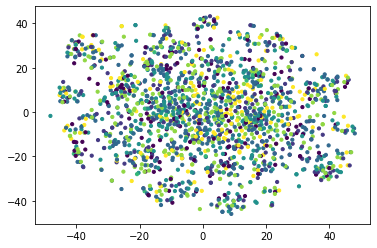

Layer: 11
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


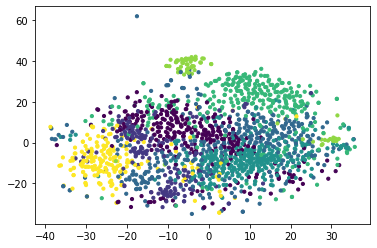

Voxel Activity Plotted:


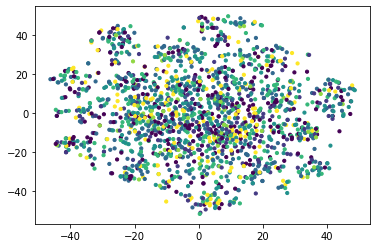

Layer: 12
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


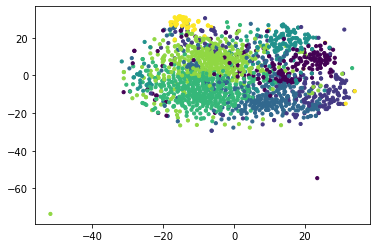

Voxel Activity Plotted:


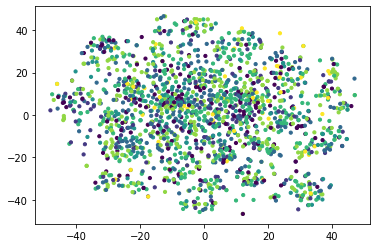

Layer: 13
(1750, 512, 7, 7)
(1750, 25088)
Features plotted:


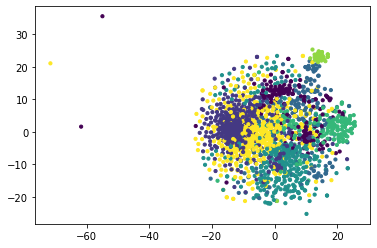

Voxel Activity Plotted:


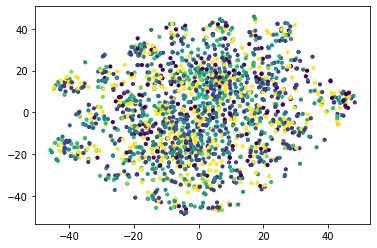

In [ ]:
for l in range(1,14):
  layer = feat.item().get('layer{}'.format(l))
  print("Layer: {}".format(l))
  print(layer.shape)
  data = np.reshape(layer,(layer.shape[0],-1))
  print(data.shape)
  X_reduced = tsne.fit_transform(data) 
  kmeans = KMeans(n_clusters = 7,max_iter = 500)
  kmeans.fit(data) 
  clusteres = kmeans.labels_
  Y_reduced = tsne.fit_transform(responses)   
  print("Features plotted:")
  plt.scatter(X_reduced[:,0], X_reduced[:,1], c = clusteres,s = 10)
  plt.show()
  print("Voxel Activity Plotted:")
  plt.scatter(Y_reduced[:,0],Y_reduced[:,1],c=clusteres,s=10) 
  plt.show()

In [ ]:
reducn_func = tsne 
for i in range(1,8):
  select_roi = i
  responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
  responses_roi_reduced = reducn_func.fit_transform(responses_roi)
  clusteres = k_cosine(responses_roi)
  print("Voxel Activity: {}".format(i))
  plt.scatter(responses_roi_reduced[:,0],responses_roi_reduced[:,1],c = clusteres,s=10)
  plt.show()
  for l in range(1,14):
    layer = feat.item().get('layer{}'.format(l))
    print("Layer: {}".format(l))
    print(layer.shape)
    data = np.reshape(layer,(layer.shape[0],-1))
    print(data.shape)
    X_reduced = tsne.fit_transform(data)
    plt.scatter(X_reduced[:,0], X_reduced[:,1],c=clusteres,s = 10)
    plt.show()

In [ ]:
# X_reduced = pca.fit_transform(data)                             #PCA
X_reduced = tsne.fit_transform(data)                              #TSNE
# X_reduced =  lda.fit_transform(data)             #Linear Dirichlet Analysis
# X_reduced = lda_.fit_transform(data,num_labels)  #Linear Discriminant Analysis

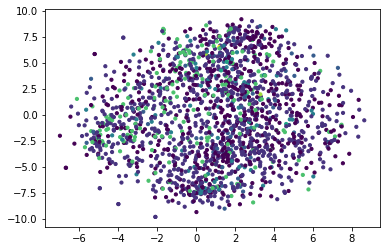

In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1], c = num_labels,s = 10)

##On Responses

In [ ]:
Y_reduced = pca.fit_transform(responses)                             #PCA
Y_reduced = tsne.fit_transform(responses)                              #TSNE
# Y_reduced =  lda.fit_transform(responses)             #Linear Dirichlet Analysis
# Y_reduced = lda_.fit_transform(responses,num_labels)  #Linear Discriminant Analysis

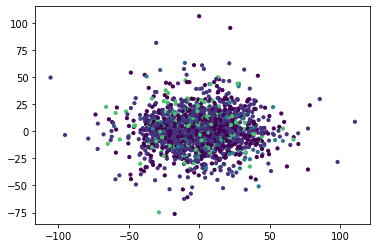

In [ ]:
plt.scatter(Y_reduced[:,0], Y_reduced[:,1], c = num_labels,s = 10)

## On Responses Based on ROI

In [ ]:
reducn_func = tsne               #Choose among pca, tsne, lda,lda_
from sklearn.manifold import TSNE
tsne = TSNE(n_components = 2)
for i in range(1,8):
  select_roi = i
  responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
  responses_roi_reduced = reducn_func.fit_transform(responses_roi)
  plt.scatter(responses_roi_reduced[:,0], responses_roi_reduced[:,1],c=kmeans.labels_,s = 10)
  plt.show()

NameError: ignored

#Clustering Voxel Activity

##k-Means

###Clustering all Voxel_activity

In [ ]:
from sklearn.cluster import KMeans
# kmeans = KMeans(n_clusters = 2,max_iter = 500)
# kmeans.fit(responses)

In [ ]:
plt.scatter(Y_reduced[:,0], Y_reduced[:,1], c = kmeans.labels_,s = 10)
plt.xlim([-75,75])
plt.ylim([-75,75])

NameError: ignored

###Clustering only ROI activity

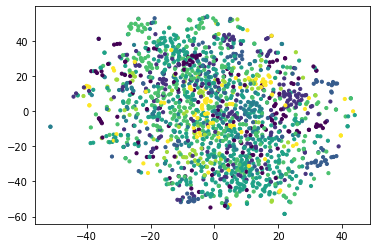

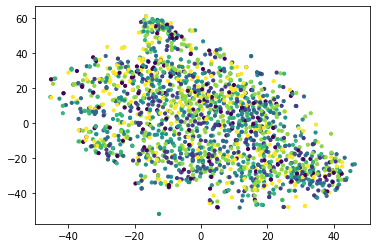

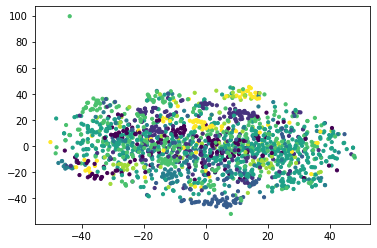

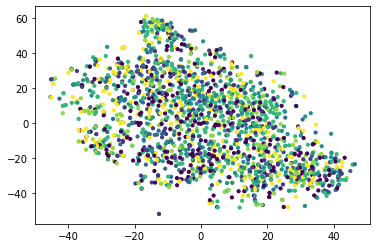

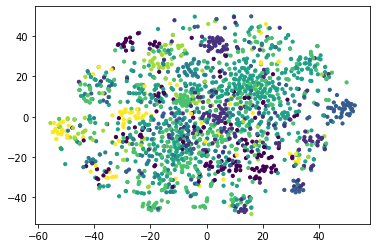

...

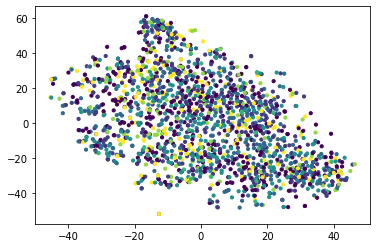

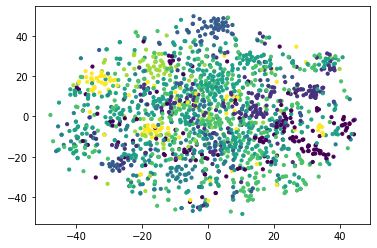

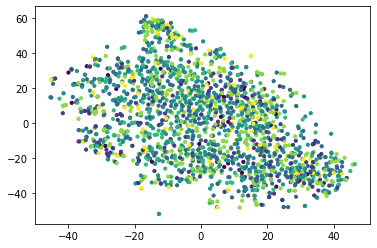

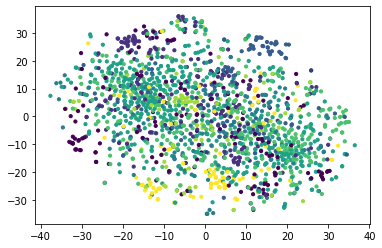

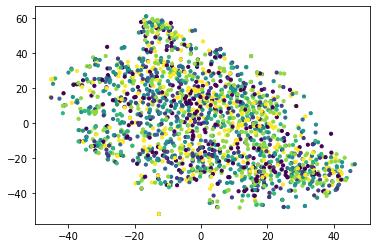

In [ ]:
for i in range(1,8):
  select_roi = i
  kmeans = KMeans(n_clusters = 7,max_iter = 500)
  responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
  kmeans.fit(responses)
  responses_reduced = tsne.fit_transform(responses_roi)
  plt.scatter(responses_reduced[:,0], responses_reduced[:,1],c=clusteres,s = 10)
  plt.show()
  plt.scatter(X_reduced[:,0], X_reduced[:,1],c=kmeans.labels_,s = 10)
  plt.show()

##My Own k-Means based on cosine similarity.

In [ ]:
def cosine_similarity(v1,v2):
  if np.linalg.norm(v1)==0 or np.linalg.norm(v2)==0:
    return 0
  return np.abs((v1 @ v2)/(np.linalg.norm(v1)*np.linalg.norm(v2)))


def get_loss(data,centroids,assigned,n_components):
  loss = 0
  for i in range(n_components):
    cluster = data[np.where(assigned ==i)]
    for point in cluster:
      loss+=(1-cosine_similarity(centroids[i],point))
  loss/=data.shape[0]
  return loss


def update_centroid(data,assigned,n_components):
  m = data.shape[1]
  centroids = np.zeros((n_components,m))
  for i in range(n_components):
    cluster = data[np.where(assigned==i)]
    for point in cluster:
      centroids[i]+=(point/np.linalg.norm(point))
    centroids[i]/=m
  return centroids


In [ ]:
def k_cosine(data, n_components = 8, init = 'random', max_itr=10,tol = 1e-4,stats =False):
  if len(data)<n_components:
    return data
  if init=='random':
    idx = np.random.choice(len(data),n_components)
    centroids = data[idx]
  # print(centroids)
  ##Fitting Part
  assigned = np.zeros((len(data),)).astype(int)
  for _ in range(max_itr):
    for j,point in enumerate(data):
      cosine = np.zeros((n_components,))
      for i,centroid in enumerate(centroids):
        cosine[i] = cosine_similarity(point,centroid)
      assigned[j] = np.argmax(cosine)
    if stats==True and _%1 ==0:
      print("Iteration Number: {}\nLoss: {}".format(_,get_loss(data,centroids,assigned,n_components)))
    centroids = update_centroid(data,assigned,n_components)
  return assigned

In [ ]:
select_roi = 1
responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]

In [ ]:
clusteres = k_cosine(data,n_components = 8,max_itr = 50)

Responses Plotted:


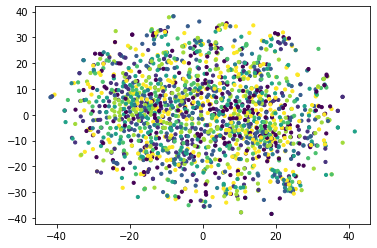

Features Plotted:


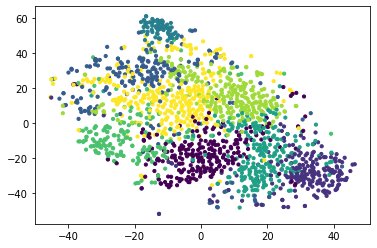

Features Plotted with Labels as colour:


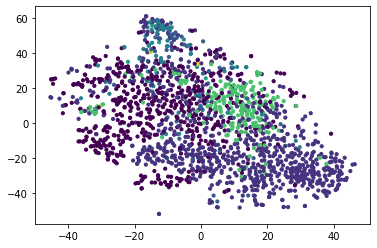

In [ ]:
responses_reduced = tsne.fit_transform(responses_roi)
print("Responses Plotted:")
plt.scatter(responses_reduced[:,0], responses_reduced[:,1],c=clusteres,s = 10)
plt.show()
print("Features Plotted:")
plt.scatter(X_reduced[:,0],X_reduced[:,1],c=clusteres,s = 10)
plt.show()
print("Features Plotted with Labels as colour:")
plt.scatter(X_reduced[:,0],X_reduced[:,1],c=num_labels,s = 10)
plt.show()

Iteration Number: 0
Loss: 0.8428710621913267
Iteration Number: 1
Loss: 0.8397787769204695
Iteration Number: 2
Loss: 0.7462047637828076
Iteration Number: 3
Loss: 0.7781935961686064
Iteration Number: 4
Loss: 0.7469324734941842
Iteration Number: 5
Loss: 0.7441562893940015
Iteration Number: 6
Loss: 0.7323200067035134
Iteration Number: 7
Loss: 0.7386948671937628
Iteration Number: 8
Loss: 0.7302973018437611
Iteration Number: 9
Loss: 0.7364896908422367
Iteration Number: 10
Loss: 0.7295364451362969
Iteration Number: 11
Loss: 0.737925899434872
Iteration Number: 12
Loss: 0.7262355859082177
Iteration Number: 13
Loss: 0.7342925608497551
Iteration Number: 14
Loss: 0.7296657756843573
Iteration Number: 15
Loss: 0.7326176586749141
Iteration Number: 16
Loss: 0.7276470216856546
Iteration Number: 17
Loss: 0.7326475482586932
Iteration Number: 18
Loss: 0.7268073131214652
Iteration Number: 19
Loss: 0.735322776646209


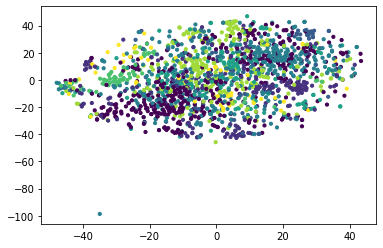

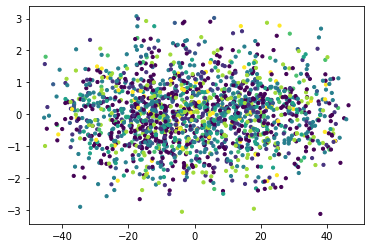

In [ ]:
select_roi = 2
responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
clusteres = k_cosine(responses_roi,n_components = 8,max_itr = 20)
responses_reduced = tsne.fit_transform(responses_roi)
plt.scatter(responses_reduced[:,0], responses_reduced[:,1],c=clusteres,s = 10)
plt.show()
plt.scatter(X_reduced[:,0],responses[:,1],c=clusteres,s = 10)

Iteration Number: 0
Loss: 0.8627566956702193
Iteration Number: 1
Loss: 0.8578005464782333
Iteration Number: 2
Loss: 0.8209461222289908
Iteration Number: 3
Loss: 0.8211722869660997
Iteration Number: 4
Loss: 0.7800056888935496
Iteration Number: 5
Loss: 0.7716360823275443
Iteration Number: 6
Loss: 0.7539703810334143
Iteration Number: 7
Loss: 0.7512475172829062
Iteration Number: 8
Loss: 0.7467663674582853
Iteration Number: 9
Loss: 0.7423571881057225
Iteration Number: 10
Loss: 0.7447350095793622
Iteration Number: 11
Loss: 0.7410538295137417
Iteration Number: 12
Loss: 0.745676695118697
Iteration Number: 13
Loss: 0.7411680838010235
Iteration Number: 14
Loss: 0.7445331304006185
Iteration Number: 15
Loss: 0.7408516331064666
Iteration Number: 16
Loss: 0.743205782378613
Iteration Number: 17
Loss: 0.7400763085646715
Iteration Number: 18
Loss: 0.7386066500607329
Iteration Number: 19
Loss: 0.7394051750833539


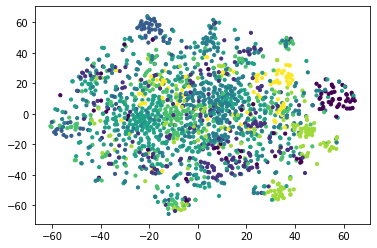

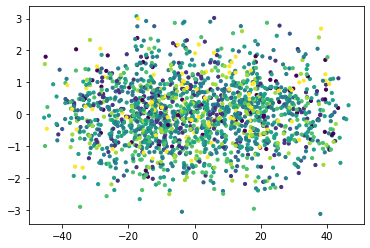

In [ ]:
select_roi = 3
responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
clusteres = k_cosine(responses_roi,n_components = 8,max_itr = 20)
responses_reduced = tsne.fit_transform(responses_roi)
plt.scatter(responses_reduced[:,0], responses_reduced[:,1],c=clusteres,s = 10)
plt.show()
plt.scatter(X_reduced[:,0],responses[:,1],c=clusteres,s = 10)

Iteration Number: 0
Loss: 0.7976764098755714
Iteration Number: 1
Loss: 0.8070175159668845
Iteration Number: 2
Loss: 0.7689909887151917
Iteration Number: 3
Loss: 0.7678410337694128
Iteration Number: 4
Loss: 0.7985861373905149
Iteration Number: 5
Loss: 0.7632901016081984
Iteration Number: 6
Loss: 0.7289090052497759
Iteration Number: 7
Loss: 0.7332418397792285
Iteration Number: 8
Loss: 0.726798479430136
Iteration Number: 9
Loss: 0.7295750412054803
Iteration Number: 10
Loss: 0.7050845754205775
Iteration Number: 11
Loss: 0.7172908369609383
Iteration Number: 12
Loss: 0.7074412357605353
Iteration Number: 13
Loss: 0.7134956144892455
Iteration Number: 14
Loss: 0.7021857910367925
Iteration Number: 15
Loss: 0.7094888659928551
Iteration Number: 16
Loss: 0.7045361959894448
Iteration Number: 17
Loss: 0.7025020804638578
Iteration Number: 18
Loss: 0.7058915049815538
Iteration Number: 19
Loss: 0.7008831332856971


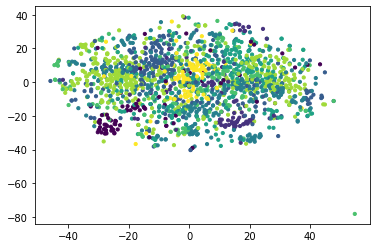

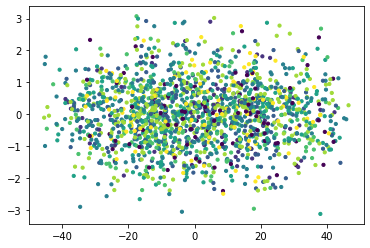

In [ ]:
select_roi = 4
responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
clusteres = k_cosine(responses_roi,n_components = 8,max_itr = 20)
responses_reduced = tsne.fit_transform(responses_roi)
plt.scatter(responses_reduced[:,0], responses_reduced[:,1],c=clusteres,s = 10)
plt.show()
plt.scatter(X_reduced[:,0],responses[:,1],c=clusteres,s = 10)

Iteration Number: 0
Loss: 0.8275477279062644
Iteration Number: 1
Loss: 0.828307343685133
Iteration Number: 2
Loss: 0.7977205116013013
Iteration Number: 3
Loss: 0.7990279219794195
Iteration Number: 4
Loss: 0.8080265777263711
Iteration Number: 5
Loss: 0.7719899970974282
Iteration Number: 6
Loss: 0.7719096270286816
Iteration Number: 7
Loss: 0.758479196737292
Iteration Number: 8
Loss: 0.748850326145738
Iteration Number: 9
Loss: 0.7745163610167869
Iteration Number: 10
Loss: 0.7289327365609352
Iteration Number: 11
Loss: 0.7580308168491506
Iteration Number: 12
Loss: 0.7274414498366603
Iteration Number: 13
Loss: 0.7532964602911671
Iteration Number: 14
Loss: 0.7150908028844851
Iteration Number: 15
Loss: 0.7267400272343062
Iteration Number: 16
Loss: 0.7107165198166902
Iteration Number: 17
Loss: 0.7131561918165621
Iteration Number: 18
Loss: 0.7109322263444265
Iteration Number: 19
Loss: 0.7135230226375825


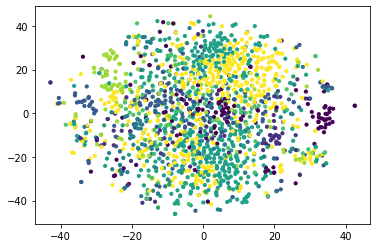

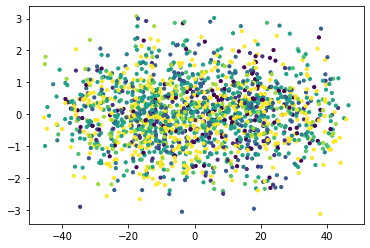

In [ ]:
select_roi = 5
responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
clusteres = k_cosine(responses_roi,n_components = 8,max_itr = 20)
responses_reduced = tsne.fit_transform(responses_roi)
plt.scatter(responses_reduced[:,0], responses_reduced[:,1],c=clusteres,s = 10)
plt.show()
plt.scatter(X_reduced[:,0],responses[:,1],c=clusteres,s = 10)

Iteration Number: 0
Loss: 0.8725529299675966
Iteration Number: 1
Loss: 0.8790722493381591
Iteration Number: 2
Loss: 0.8354169255423488
Iteration Number: 3
Loss: 0.8596190740127237
Iteration Number: 4
Loss: 0.7998181822510062
Iteration Number: 5
Loss: 0.8229290806097966
Iteration Number: 6
Loss: 0.7863513487598746
Iteration Number: 7
Loss: 0.7933697399493382
Iteration Number: 8
Loss: 0.7793086254510201
Iteration Number: 9
Loss: 0.778991751995338
Iteration Number: 10
Loss: 0.7781993691192294
Iteration Number: 11
Loss: 0.7747373266687596
Iteration Number: 12
Loss: 0.7733237112488807
Iteration Number: 13
Loss: 0.7747474914419396
Iteration Number: 14
Loss: 0.7756905112457699
Iteration Number: 15
Loss: 0.7726536748276863
Iteration Number: 16
Loss: 0.7727153326703904
Iteration Number: 17
Loss: 0.7685347245149339
Iteration Number: 18
Loss: 0.7729628723879837
Iteration Number: 19
Loss: 0.7676673254602558


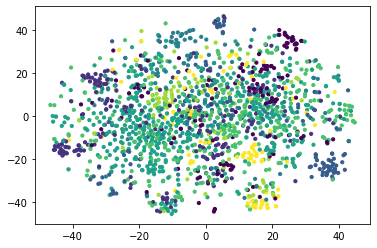

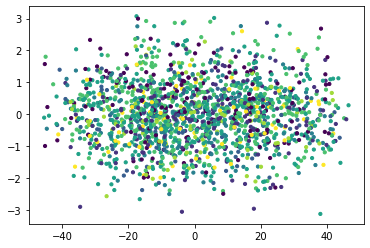

In [ ]:
select_roi = 6
responses_roi = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
clusteres = k_cosine(responses_roi,n_components = 8,max_itr = 20)
responses_reduced = tsne.fit_transform(responses_roi)
plt.scatter(responses_reduced[:,0], responses_reduced[:,1],c=clusteres,s = 10)
plt.show()
plt.scatter(X_reduced[:,0],responses[:,1],c=clusteres,s = 10)

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter
from scipy import stats
import sklearn.linear_model as skl


In [ ]:
X_data = data
select_roi = 5
y_used = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]

In [ ]:
beta = 10
var = 1

theta_hat = np.linalg.inv(X_data.T @ X_data + var * beta * np.eye(X_data.shape[1])) @ X_data.T @ y_used
# plt.hist(theta_hat)
y_hat = X_data @ theta_hat
mse = np.mean((y_used - y_hat)**2)
print(mse)
# print(stats.ttest_ind(y_used, y_hat))

0.38399167303221377


#Visualising with Clusters and Images.

In [ ]:
select_roi = 1
kmeans = KMeans(n_clusters = 8,max_iter = 500)
if select_roi==-1:
  selected_region = dat['responses']
else:
  selected_region = dat['responses'][:,np.where(dat['roi'] == select_roi)[0]]
clusters_cosine = k_cosine(selected_region,n_components = 8,max_itr = 20)
kmeans.fit(selected_region)
clusters_kmeans = kmeans.labels_

In [ ]:
selected_region_reduced = tsne.fit_transform(selected_region)

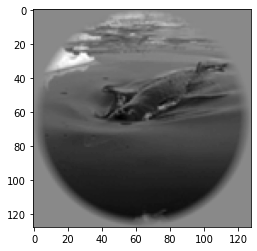

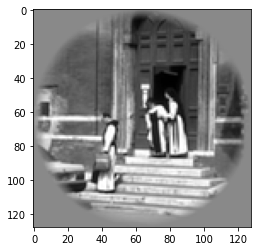

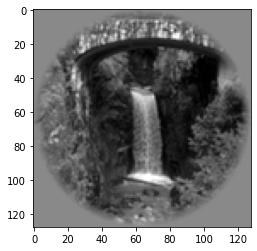

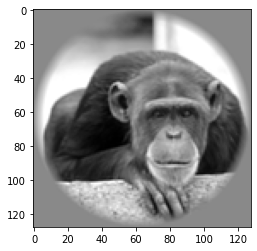

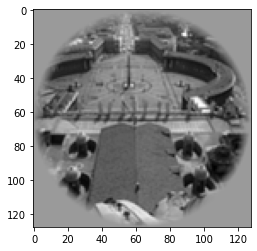

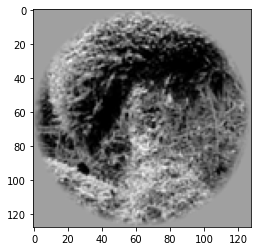

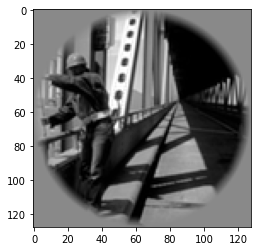

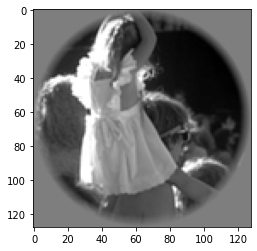

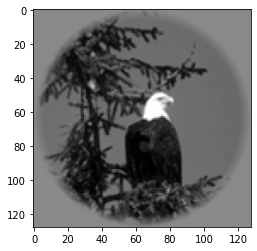

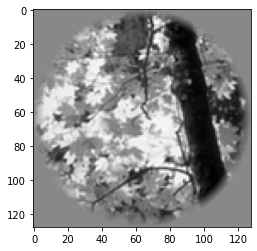

In [ ]:
num_images = 10
select_category = 3    #Between 0-7
for i in np.random.choice(np.where(clusters_cosine==clusteres)[0],num_images):
  plt.imshow(dat['stimuli'][i],cmap = 'gray')
  plt.show()

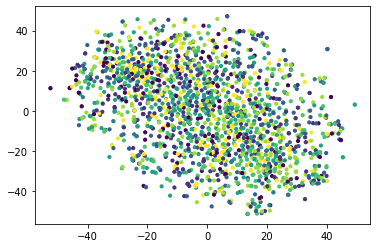

In [ ]:
plt.scatter(selected_region_reduced[:,0],selected_region_reduced[:,1],c = clusters_kmeans,s=10)

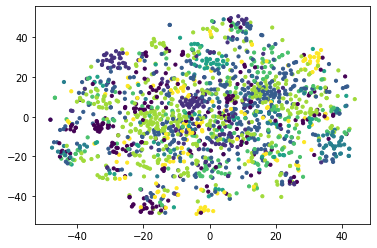

In [ ]:
plt.scatter(selected_region_reduced[:,0],selected_region_reduced[:,1],c = clusters_cosine,s=10)